In [ ]:
import sys
import os
import logging

sys.path.insert(1, os.path.join(sys.path[0], '../../src'))
logging.getLogger("pytorch_lightning").setLevel(logging.WARNING)

In [ ]:
from pytorch_lightning.callbacks.early_stopping import EarlyStopping

from darts.dataprocessing.transformers.scaler import Scaler
from sklearn.preprocessing import MinMaxScaler

In [ ]:
from datasets import ShellDataset, PaloAltoDataset, BoulderDataset
from visualization import plot_time_series_predictions
from evaluation import evaluate, print_metrics_table
from models import train_predict, train_predict_past_covariates, train_predict_global, train_predict_global_past_covariates

### Set Experiment Parameters

In [ ]:
FORECAST_HORIZON = 7
INPUT_CHUNK_LENGTH = 30
USE_COVARIATES = False
TRAIN_DATA = 240 # 8 months
TEST_DATA = 90 # 3 months

### Load Dataset

In [ ]:
from datasets import ShellDataset
series_dataset = ShellDataset()
series = series_dataset.load(subset=None, train_length=TRAIN_DATA, test_length=TEST_DATA, na_threshold=0.1)

## Scale series Data

In [ ]:
# Transform splits
series_scaler = Scaler(MinMaxScaler())
series_train = series_scaler.fit_transform(series['train'])
series_test= series_scaler.transform(series['test'])

In [ ]:
predictions = {}

# Baseline

In [ ]:
from darts.models.forecasting.baselines import NaiveMean
def load_baselinemodel():
    return NaiveMean()

In [ ]:
predictions_baseline = []
for series_train_single, series_test_single in zip(series_train, series_test):
    model = load_baselinemodel()

    forecast = train_predict(model, 
                        series_train=series_train_single, 
                        series_test=series_test_single, 
                        horizon=FORECAST_HORIZON, 
                        retrain=True)
    
    predictions_baseline.append(forecast)
predictions_baseline = series_scaler.inverse_transform(predictions_baseline)
predictions['Baseline'] = predictions_baseline

In [ ]:
evaluate(predictions['Baseline'], series['test'])

# Local Training

#### ARIMA

In [ ]:
def load_arimamodel():
    from darts.models import ARIMA
    return ARIMA(
        p=INPUT_CHUNK_LENGTH,
        d=0,
        q=INPUT_CHUNK_LENGTH
    )

In [ ]:
%%capture
predictions_arima = []
for series_train_single, series_test_single in zip(series_train, series_test):
    model = load_arimamodel()

    forecast = train_predict(model, 
                        series_train=series_train_single, 
                        series_test=series_test_single, 
                        horizon=FORECAST_HORIZON, 
                        retrain=False)
    
    predictions_arima.append(forecast)
predictions_arima = series_scaler.inverse_transform(predictions_arima)
predictions['ARIMA'] = predictions_arima

In [ ]:
evaluate(predictions['ARIMA'], series['test'])

## Transformer

In [ ]:
from darts.models import TransformerModel

def load_transformermodel():
    return TransformerModel(
        nr_epochs_val_period=1,
        nhead=8,
        num_encoder_layers=1,
        num_decoder_layers=1,
        dim_feedforward=128,
        input_chunk_length=INPUT_CHUNK_LENGTH,
        output_chunk_length=FORECAST_HORIZON,
        random_state=0,
        # add_encoders=past_datetime_encoder,
        pl_trainer_kwargs={"callbacks": [EarlyStopping(monitor="val_loss", patience=10, min_delta=0.01, mode='min')], "log_every_n_steps": 1},
    )

In [ ]:
predictions_transformer = []
for series_train_single, series_test_single in zip(series_train, series_test):
    model = load_transformermodel()

    forecast = train_predict(model,
                        series_train=series_train_single,
                        series_test=series_test_single,
                        horizon=FORECAST_HORIZON,
                        train_split=0.7,
                        retrain=False)
    
    predictions_transformer.append(forecast)
predictions_transformer = series_scaler.inverse_transform(predictions_transformer)
predictions['Transformer'] = predictions_transformer

In [ ]:
evaluate(predictions['Transformer'], series['test'])

## NHITS

In [ ]:
from darts.models import NHiTSModel

def load_nhitsmodel():
    return NHiTSModel(
        nr_epochs_val_period=1,
        input_chunk_length=INPUT_CHUNK_LENGTH,
        output_chunk_length=FORECAST_HORIZON,
        random_state=0,
        # add_encoders=past_datetime_encoder,
        pl_trainer_kwargs={"callbacks": [EarlyStopping(monitor="val_loss", patience=10, min_delta=0.01, mode='min')], "log_every_n_steps": 1},
    )

In [81]:
%%capture
predictions_nhits = []
for series_train_single, series_test_single in zip(series_train, series_test):
    model = load_nhitsmodel()

    forecast = train_predict(model,
                        series_train=series_train_single,
                        series_test=series_test_single,
                        horizon=FORECAST_HORIZON,
                        train_split=0.7,
                        retrain=False)
    
    predictions_nhits.append(forecast)
predictions_nhits = series_scaler.inverse_transform(predictions_nhits)
predictions['NHiTS (Local)'] = predictions_nhits

In [82]:
evaluate(predictions['NHiTS (Local)'], series['test'])

{'RMSE': 132.39970162041087,
 'MAE': 108.99897916253882,
 'MAPE': 72.33907852014697}

# Global Training

In [83]:

nhits_model = load_nhitsmodel()
nhits_model_fit, predictions_nhits_global = train_predict_global(
                                                            model=nhits_model, 
                                                            series_train=series_train, 
                                                            series_test=series_test, 
                                                            horizon=FORECAST_HORIZON, 
                                                            train_split=0.7, 
                                                            retrain=False
                                                        )

predictions_nhits_global = series_scaler.inverse_transform(predictions_nhits_global)
predictions['NHiTS (Global)'] = predictions_nhits_global


Sanity Checking: 0it [00:00, ?it/s]

Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

In [84]:
evaluate(predictions['NHiTS (Global)'], series['test'])

{'RMSE': 122.4043838014875,
 'MAE': 98.64540983159463,
 'MAPE': 40.213135221897616}

# Results

## Metrics

In [85]:
print(f"{USE_COVARIATES=},{FORECAST_HORIZON=},{INPUT_CHUNK_LENGTH=},{TRAIN_DATA=},{TEST_DATA=}, {series_dataset.__class__.__name__},{len(series['train'])=},{len(series['test'])=})")
for model, model_predictions in predictions.items():
    results = evaluate(model_predictions, series['test'])
    print(f"Model:", model, results)

USE_COVARIATES=False,FORECAST_HORIZON=7,INPUT_CHUNK_LENGTH=30,TRAIN_DATA=240,TEST_DATA=90, ShellDataset,len(series['train'])=46,len(series['test'])=46)
Model: Baseline {'RMSE': 125.60216907428733, 'MAE': 102.6784627706402, 'MAPE': 42.52328698373744}
Model: ARIMA {'RMSE': 137.39467219452814, 'MAE': 111.16923321461302, 'MAPE': 74.88766702735711}
Model: Transformer {'RMSE': 129.25744318203465, 'MAE': 106.79718202235863, 'MAPE': 59.286905551841045}
Model: NHiTS (Local) {'RMSE': 132.39970162041087, 'MAE': 108.99897916253882, 'MAPE': 72.33907852014697}
Model: NHiTS (Global) {'RMSE': 122.4043838014875, 'MAE': 98.64540983159463, 'MAPE': 40.213135221897616}


## Visualisation

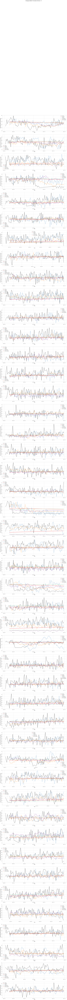

In [86]:
plot_time_series_predictions(predictions, series['test'], FORECAST_HORIZON)